# Fb-Prophet с несколькими регрессорами: для анализа временных рядов

Fb-Prophet, также известный как Prophet, это библиотека с открытым исходным кодом, разработанная Facebook для прогнозирования временных рядов. Она разработана для удобства использования и эффективности, особенно для данных с трендами и сезонностью.
Списочек достоинств данного чуда:
1. По сравнению с традиционными моделями временных рядов, Prophet требует меньше ручной настройки. Он автоматически обнаруживает тренды, сезонность (такие как ежегодные или еженедельные паттерны) и праздники в ваших данных.
2. Prophet особенно хорошо справляется с данными с сильными сезонными эффектами. Он может улавливать сложные сезонные паттерны, что делает его подходящим для прогнозирования таких вещей, как розничные продажи или трафик на веб-сайтах.
3. Мы можем учесть влияние праздников на наши прогнозы. Это полезно в ситуациях, когда праздники могут значительно влиять на данные, например, продажи во время Черной пятницы или на Рождество.
4. Prophet может обрабатывать пропущенные точки данных и даже корректировать неожиданные сдвиги в трендах.

Prophet предлагает мощный и удобный способ делать прогнозы временных рядов, особенно для данных с трендами, сезонностью и праздниками. Однако всегда полезно учитывать характер наших данных и исследовать другие методики, если это необходимо.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings .filterwarnings("ignore")

In [2]:
df = pd.read_csv("Datasets/Data_Kraljevo.csv", sep=',')
df.head()

,Datetime,AirTemperature,CloudOpacity,DHI,DNI,EBH,GHI,Production - Kraljevo Location
0,11/22/2022 14:00,6.1,91,68,1.1,1,69,31.246833
1,11/22/2022 15:00,5.9,71,55,4.5,1,56,3.480250
2,11/22/2022 16:00,5.2,100,19,1.5,0,19,0.000000
3,11/22/2022 17:00,5.1,79,0,0.0,0,0,0.000000
4,11/22/2022 18:00,5.0,60,0,0.0,0,0,0.000000


In [3]:
# Выбираем только нужные столбцы из исходного DataFrame для анализа временных рядов
df2 = df[["Datetime","Production - Kraljevo Location"]]

# Преобразуем столбец 'Datetime' в формат datetime для корректной работы с временными данными
df2['Datetime'] = pd.to_datetime(df2['Datetime'], format='mixed')

# Создаем линейную диаграмму с помощью библиотеки Plotly Express,
# где на оси X будет время (столбец 'Datetime'), а на оси Y - производство (столбец 'Production - Kraljevo Location')
fig = px.line(df2, x='Datetime', y='Production - Kraljevo Location')

# Включаем ползунок для изменения масштаба по оси X, чтобы пользователь мог лучше исследовать временной диапазон
fig.update_xaxes(rangeslider_visible=True)
fig.show()

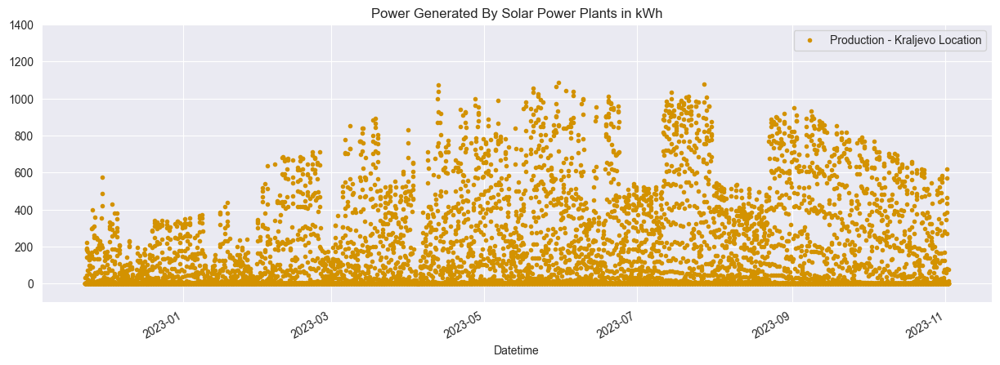

In [4]:
# Выбираем только нужные столбцы из исходного DataFrame для анализа временных рядов
df1 = df[["Datetime", "Production - Kraljevo Location"]]

# Преобразуем столбец 'Datetime' в формат datetime для корректной работы с временными данными
df1['Datetime'] = pd.to_datetime(df1['Datetime'], format='mixed')

# Устанавливаем столбец 'Datetime' в качестве индекса DataFrame для работы с временными рядами
df1.set_index("Datetime", inplace=True)

# Задаем цвета для графика
color_pal = ["#F8766D", "#D39200", "#93AAG0","#00BA38", "#@0C19F", "#@OB9E3", "#619CFF", "#DB72FB"]

# Строим график с точками (style='.') с заданным размером и цветом, а также с заголовком
df1.plot(style='.', figsize=(15,5), color=color_pal[1], title='Производство солнечной энергии в кВт-ч')

# Задаем пределы по оси Y, чтобы лучше визуализировать данные
plt.ylim([-100,1400])
plt.show()

In [5]:
df['Datetime'] = pd.to_datetime(df['Datetime'],format='mixed')
df.head()

,Datetime,AirTemperature,CloudOpacity,DHI,DNI,EBH,GHI,Production - Kraljevo Location
0,2022-11-22 14:00:00,6.1,91,68,1.1,1,69,31.246833
1,2022-11-22 15:00:00,5.9,71,55,4.5,1,56,3.480250
2,2022-11-22 16:00:00,5.2,100,19,1.5,0,19,0.000000
3,2022-11-22 17:00:00,5.1,79,0,0.0,0,0,0.000000
4,2022-11-22 18:00:00,5.0,60,0,0.0,0,0,0.000000


In [7]:
from datetime import timedelta
import plotly.offline as py
py.init_notebook_mode()

## Модели Prophet понимают только ds и y как входные и выходные характеристики. Поэтому перед обучением и прогнозированием убедимся, что мы переименовали наши столбцы.

In [8]:
df = df[['Datetime', 'Production - Kraljevo Location', 'AirTemperature', 'CloudOpacity', 'DHI', 'DNI']]
df['Datetime'] = pd.to_datetime(df['Datetime'])
df.columns = ['ds', 'y', 'temp', 'Cloud', 'DHI', 'GHI']
df.head()

,ds,y,temp,Cloud,DHI,GHI
0,2022-11-22 14:00:00,31.246833,6.1,91,68,1.1
1,2022-11-22 15:00:00,3.480250,5.9,71,55,4.5
2,2022-11-22 16:00:00,0.000000,5.2,100,19,1.5
3,2022-11-22 17:00:00,0.000000,5.1,79,0,0.0
4,2022-11-22 18:00:00,0.000000,5.0,60,0,0.0


## Прогнозы затем делаются на dataframe с колонкой ds, содержащей даты, для которых нужно сделать прогноз. Мы можем получить подходящий dataframe, который простирается в будущее на определенное количество дней, используя вспомогательный метод Prophet.make_future_dataframe. По умолчанию он также будет включать даты из истории.

## Добавление непрерывных регрессоров
В этом проекте я просто добавлю несколько регрессоров: температуру, облачность, диффузное горизонтальное излучение (DHT) и глобальное горизонтальное излучение (GHT).
Использование дополнительных регрессоров может позволить вам включить больше информации для обучения моделей, что приводит к большей предсказательной силе.

Сначала создаём регрессор для температуры, затем подгоняем модель к данным, исключив последние 4 недели. Затем делаем прогноз на 4 недели, используя эти неподогнанные 4 недели данных о температуре в будущем DataFrame.

In [9]:
# Импортируем класс Prophet из библиотеки Prophet для прогнозирования временных рядов
from prophet import Prophet

# Создаем модель Prophet с мультипликативным режимом сезонности и годовой сезонностью, повторяющейся каждые 3 года
model = Prophet(seasonality_mode='multiplicative', yearly_seasonality=3)

# Добавляем регрессоры для температуры, облачности, диффузного горизонтального излучения и глобального горизонтального излучения
model.add_regressor('temp')
model.add_regressor('Cloud')
model.add_regressor('DHI')
model.add_regressor('GHI')

# Обучаем модель на данных, исключая последние 4 недели, чтобы использовать их для тестирования
model.fit(df[df['ds'] < df['ds'].max() - timedelta(weeks=4)])
# Создаем DataFrame для будущих дат, на которых будет производиться прогноз
future = model.make_future_dataframe(periods=28)

# Добавляем данные по регрессорам в будущий DataFrame
future['temp'] = df['temp']
future['Cloud'] = df['Cloud']
future['DHI'] = df['DHI']
future['GHI'] = df['GHI']

# Производим прогноз с помощью обученной модели
forecast = model.predict(future)

21:50:14 - cmdstanpy - INFO - Chain [1] start processing
21:50:17 - cmdstanpy - INFO - Chain [1] done processing


In [10]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
7623,2023-10-29 06:00:00,-23.094750,-147.429127,100.316563
7624,2023-10-30 06:00:00,-22.924146,-150.033518,100.202226
7625,2023-10-31 06:00:00,7.670262,-115.024260,133.638452
7626,2023-11-01 06:00:00,74.399161,-60.843830,191.436789
7627,2023-11-02 06:00:00,197.392881,53.847316,343.486489


## Метод predict присвоит каждой строке в future предсказанное значение, которое он называет yhat. Если мы передадим исторические даты, он предоставит внутри-выборочное соответствие. Объект прогноза здесь - это новый dataframe, который включает столбец yhat с прогнозом, а также столбцы для компонентов и интервалов неопределенности.

In [11]:
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Cloud,Cloud_lower,Cloud_upper,DHI,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
0,2022-11-22 14:00:00,80.918709,-51.299407,193.972099,80.918709,80.918709,-0.046576,-0.046576,-0.046576,0.001461,...,0.035905,0.035905,0.035905,-0.168908,-0.168908,-0.168908,0.0,0.0,0.0,70.433850
1,2022-11-22 15:00:00,80.876766,-99.362762,154.693369,80.876766,80.876766,-0.017410,-0.017410,-0.017410,-0.031477,...,0.039328,0.039328,0.039328,-0.168749,-0.168749,-0.168749,0.0,0.0,0.0,30.627234
2,2022-11-22 16:00:00,80.834823,-140.342068,98.635206,80.834823,80.834823,-0.059701,-0.059701,-0.059701,-0.122691,...,0.042461,0.042461,0.042461,-0.168590,-0.168590,-0.168590,0.0,0.0,0.0,-21.739352
3,2022-11-22 17:00:00,80.792880,-185.281033,70.127404,80.792880,80.792880,-0.029076,-0.029076,-0.029076,-0.170832,...,0.045277,0.045277,0.045277,-0.168431,-0.168431,-0.168431,0.0,0.0,0.0,-53.918975
4,2022-11-22 18:00:00,80.750937,-179.727558,64.913487,80.750937,80.750937,-0.001368,-0.001368,-0.001368,-0.170832,...,0.047751,0.047751,0.047751,-0.168271,-0.168271,-0.168271,0.0,0.0,0.0,-63.695801


In [12]:
from prophet.plot import (
plot_plotly,
plot_components_plotly,
plot_forecast_component_plotly,
plot_seasonality_plotly
)

In [13]:
fig = plot_plotly(model, forecast, trend=True)
py.iplot(fig)

In [14]:
fig = plot_components_plotly(model, forecast, figsize=(1008, 200))
py.iplot(fig)

In [18]:
fig = plot_forecast_component_plotly(model, forecast, 'temp')
py.iplot(fig)

In [19]:
fig = plot_forecast_component_plotly(model, forecast, 'Cloud')
py.iplot(fig)

In [20]:
fig = plot_forecast_component_plotly(model, forecast, 'DHI')
py.iplot(fig)

In [21]:
fig = plot_forecast_component_plotly(model, forecast, 'GHI')
py.iplot(fig)

In [22]:
fig = plot_seasonality_plotly(model, 'yearly')
py.iplot(fig)